In [1]:
from datasets import load_dataset
ds = load_dataset('AtAndDev/clip-bicycle-e-bike')

In [2]:
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 5400
    })
    val: Dataset({
        features: ['image', 'label'],
        num_rows: 599
    })
})

In [3]:
entry = ds['train'][0]
entry

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768>,
 'label': 'e-bike'}

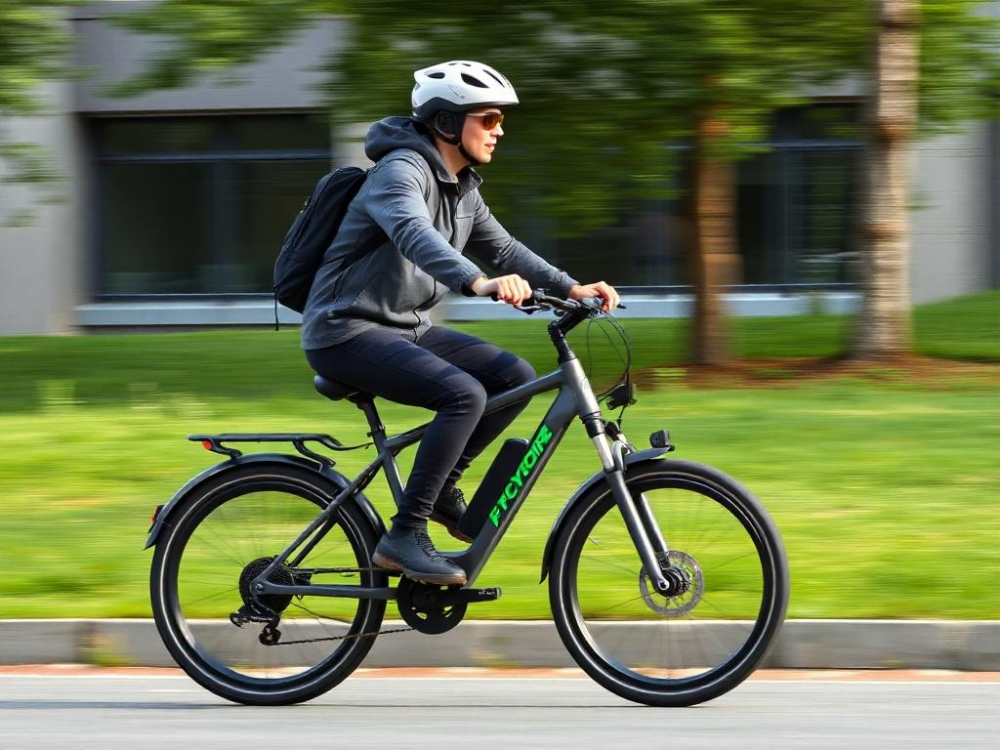

In [4]:
image = entry['image']
image

In [5]:
dataset = ds['train']

In [6]:
import clip
import torch

model, preprocess = clip.load("RN50", jit=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

CLIP(
  (visual): ModifiedResNet(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
     

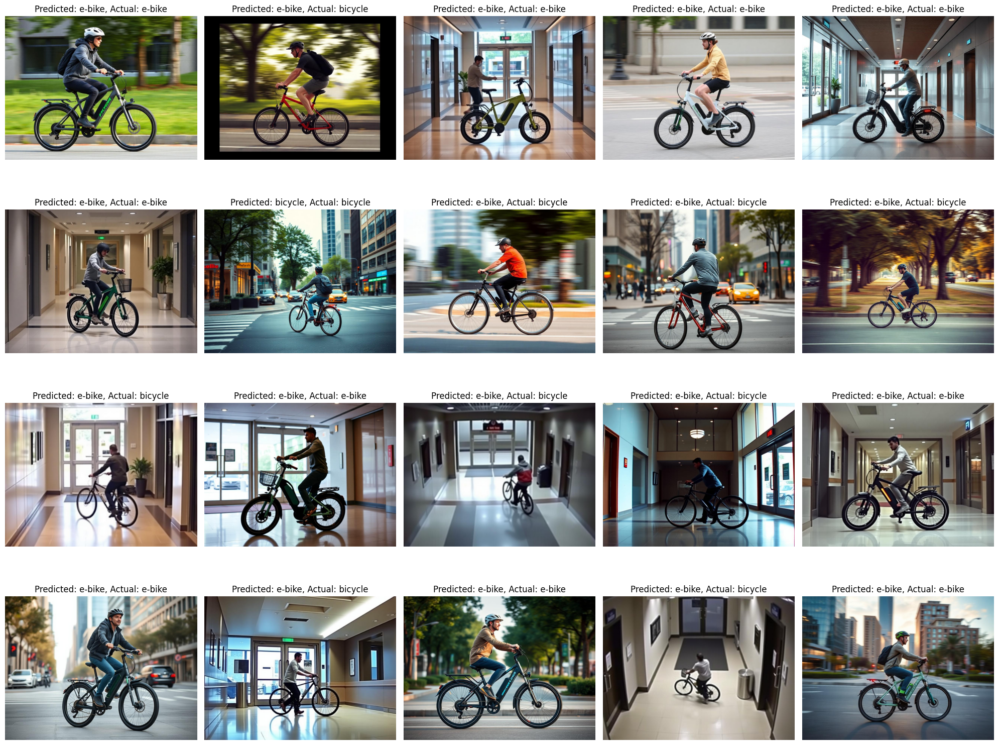

In [8]:
import matplotlib.pyplot as plt

indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

subcategories = list(set(example['label'] for example in dataset))

text_inputs = torch.cat([clip.tokenize(f"a photo of {c}") for c in subcategories]).to(device)

fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for i, idx in enumerate(indices):
    example = dataset[idx]
    image = example['image']
    subcategory = example['label']

    image_input = preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image_input)
        text_features = model.encode_text(text_inputs)

    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(1)

    ax = axes[i // 5, i % 5]
    ax.imshow(image)
    ax.set_title(f"Predicted: {subcategories[indices[0]]}, Actual: {subcategory}")
    ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
from torch.utils.data import random_split

train_size = int(.85 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [10]:
from torchvision import transforms
from torch.utils.data import Dataset

class FashionDataset(Dataset):
    def __init__(self, data):
        self.data = data
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
        ])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item['image']
        subcategory = item['label']
        label = subcategories.index(subcategory)
        return self.transform(image), label

In [11]:
from torch.utils.data import DataLoader

train_loader = DataLoader(FashionDataset(train_dataset), batch_size=32, shuffle=True)
val_loader = DataLoader(FashionDataset(val_dataset), batch_size=32, shuffle=False)

In [12]:
import torch.nn as nn

class CLIPFineTuner(nn.Module):
    def __init__(self, model, num_classes):
        super(CLIPFineTuner, self).__init__()
        self.model = model
        self.classifier = nn.Linear(model.visual.output_dim, num_classes)

    def forward(self, x):
        with torch.no_grad():
            features = self.model.encode_image(x).float()
        return self.classifier(features)

In [13]:
num_classes = len(subcategories)
model_ft = CLIPFineTuner(model, num_classes).to(device)

In [14]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_ft.classifier.parameters(), lr=1e-4)

In [15]:
from tqdm import tqdm

num_epochs = 20

for epoch in range(num_epochs):
    model_ft.train()
    running_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}, Loss: 0.0000")

    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model_ft(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        pbar.set_description(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader):.4f}")

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')

    model_ft.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model_ft(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f'Validation Accuracy: {100 * correct / total}%')

torch.save(model_ft.state_dict(), 'clip_finetuned.pth')

Epoch 1/20, Loss: 0.6728: 100%|██████████| 144/144 [00:25<00:00,  5.56it/s]


Epoch [1/20], Loss: 0.6728
Validation Accuracy: 81.9753086419753%


Epoch 2/20, Loss: 0.6346: 100%|██████████| 144/144 [00:24<00:00,  5.77it/s]


Epoch [2/20], Loss: 0.6346
Validation Accuracy: 84.19753086419753%


Epoch 3/20, Loss: 0.6005: 100%|██████████| 144/144 [00:24<00:00,  5.93it/s]


Epoch [3/20], Loss: 0.6005
Validation Accuracy: 84.44444444444444%


Epoch 4/20, Loss: 0.5716: 100%|██████████| 144/144 [00:24<00:00,  5.90it/s]


Epoch [4/20], Loss: 0.5716
Validation Accuracy: 87.03703703703704%


Epoch 5/20, Loss: 0.5459: 100%|██████████| 144/144 [00:24<00:00,  5.99it/s]


Epoch [5/20], Loss: 0.5459
Validation Accuracy: 87.03703703703704%


Epoch 6/20, Loss: 0.5187: 100%|██████████| 144/144 [00:25<00:00,  5.61it/s]


Epoch [6/20], Loss: 0.5187
Validation Accuracy: 88.51851851851852%


Epoch 7/20, Loss: 0.4978: 100%|██████████| 144/144 [00:22<00:00,  6.32it/s]


Epoch [7/20], Loss: 0.4978
Validation Accuracy: 89.38271604938272%


Epoch 8/20, Loss: 0.4781: 100%|██████████| 144/144 [00:25<00:00,  5.66it/s]


Epoch [8/20], Loss: 0.4781
Validation Accuracy: 90.37037037037037%


Epoch 9/20, Loss: 0.4574: 100%|██████████| 144/144 [00:25<00:00,  5.72it/s]


Epoch [9/20], Loss: 0.4574
Validation Accuracy: 91.48148148148148%


Epoch 10/20, Loss: 0.4432: 100%|██████████| 144/144 [00:25<00:00,  5.72it/s]


Epoch [10/20], Loss: 0.4432
Validation Accuracy: 91.48148148148148%


Epoch 11/20, Loss: 0.4249: 100%|██████████| 144/144 [00:25<00:00,  5.61it/s]


Epoch [11/20], Loss: 0.4249
Validation Accuracy: 91.72839506172839%


Epoch 12/20, Loss: 0.4109: 100%|██████████| 144/144 [00:25<00:00,  5.72it/s]


Epoch [12/20], Loss: 0.4109
Validation Accuracy: 92.46913580246914%


Epoch 13/20, Loss: 0.3944: 100%|██████████| 144/144 [00:25<00:00,  5.62it/s]


Epoch [13/20], Loss: 0.3944
Validation Accuracy: 92.34567901234568%


Epoch 14/20, Loss: 0.3817: 100%|██████████| 144/144 [00:25<00:00,  5.61it/s]


Epoch [14/20], Loss: 0.3817
Validation Accuracy: 93.08641975308642%


Epoch 15/20, Loss: 0.3697: 100%|██████████| 144/144 [00:24<00:00,  5.97it/s]


Epoch [15/20], Loss: 0.3697
Validation Accuracy: 93.08641975308642%


Epoch 16/20, Loss: 0.3612: 100%|██████████| 144/144 [00:22<00:00,  6.38it/s]


Epoch [16/20], Loss: 0.3612
Validation Accuracy: 93.45679012345678%


Epoch 17/20, Loss: 0.3481: 100%|██████████| 144/144 [00:23<00:00,  6.08it/s]


Epoch [17/20], Loss: 0.3481
Validation Accuracy: 93.08641975308642%


Epoch 18/20, Loss: 0.3396: 100%|██████████| 144/144 [00:24<00:00,  5.84it/s]


Epoch [18/20], Loss: 0.3396
Validation Accuracy: 93.70370370370371%


Epoch 19/20, Loss: 0.3290: 100%|██████████| 144/144 [00:24<00:00,  5.96it/s]


Epoch [19/20], Loss: 0.3290
Validation Accuracy: 93.70370370370371%


Epoch 20/20, Loss: 0.3181: 100%|██████████| 144/144 [00:22<00:00,  6.48it/s]


Epoch [20/20], Loss: 0.3181
Validation Accuracy: 93.82716049382717%


/tmp/ipykernel_15170/3470610588.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_ft.load_state_dict(torch.load('clip_finetuned.pth'))


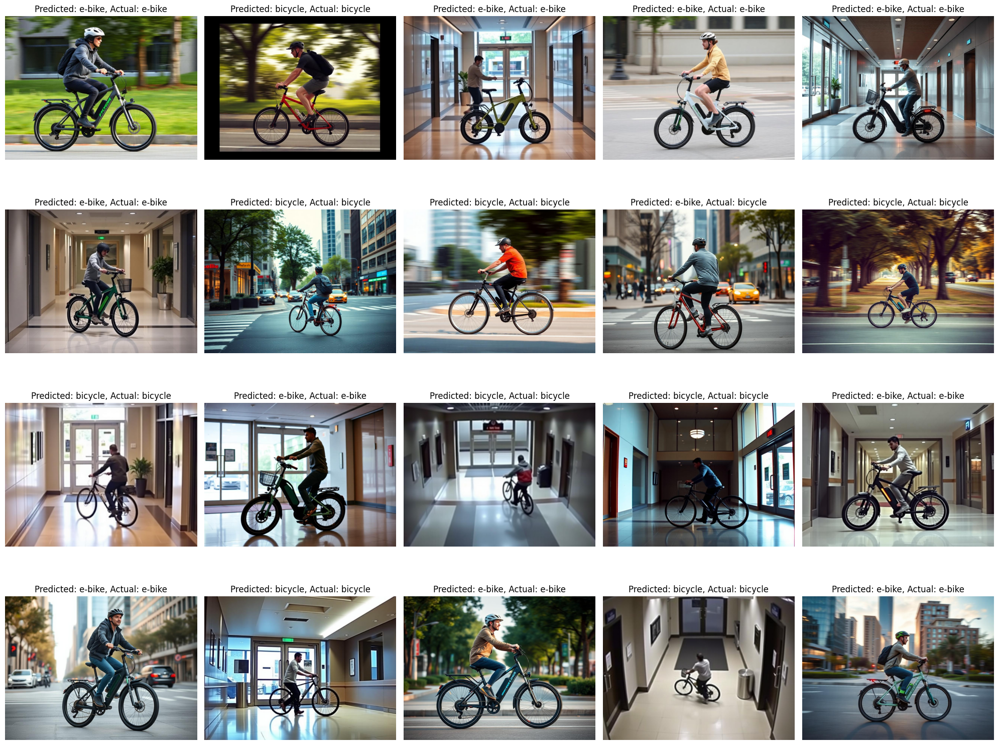

In [19]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

model_ft.load_state_dict(torch.load('clip_finetuned.pth'))
model_ft.eval()

indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
])

fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for i, idx in enumerate(indices):
    item = dataset[idx]
    image = item['image']
    true_label = item['label']

    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model_ft(image_tensor)
        _, predicted_label_idx = torch.max(output, 1)
        predicted_label = subcategories[predicted_label_idx.item()]

    ax = axes[i // 5, i % 5]
    ax.imshow(image)
    ax.set_title(f"Predicted: {predicted_label}, Actual: {true_label}")
    ax.axis('off')

plt.tight_layout()
plt.show()